### Project Description

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

#### Attribute Information:

For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

You have to build separate models that can predict the minimum temperature for the next day and the maximum temperature for the next day based on the details provided in the dataset.


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


### Exploratory data analasys (EDA)

In [3]:
# we check the dimension of the dataset using .shape matter. 
df.shape

(7752, 25)

In [4]:
# we can check the columns names and put them into a list using to_list() matter

df.columns.to_list()

['station',
 'Date',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

In [5]:
# we check the data type in our dataset using .dtypes matter. 

df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

The date column is seen as object. We have to change that in our next steps. We can see that we have only float dtype, continous data, and our targets have continous datatype as well. I will check for null values and fill them with '.mean' method. 

In [6]:
# we check for the null values in columns using .isnull.sum() matter. 

df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [7]:
# checking the null values and getting more info using .info() matter. 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


We have some null values, first I will convert the Date from object to datetime dtype and after that I will fill the null values. 

In [8]:
# Converting the datatype of Date Column from object to datetime
df['Date'] = pd.to_datetime(df.Date, format = '%d-%m-%Y')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

We succesfuly changed the 'Date' column format, now we can fill the null. 

In [9]:
# To insert the mean value of each column into its missing rows:
df.fillna(df.mean(numeric_only=True).round(1), inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7752 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7752 non-null   float64       
 3   Present_Tmin      7752 non-null   float64       
 4   LDAPS_RHmin       7752 non-null   float64       
 5   LDAPS_RHmax       7752 non-null   float64       
 6   LDAPS_Tmax_lapse  7752 non-null   float64       
 7   LDAPS_Tmin_lapse  7752 non-null   float64       
 8   LDAPS_WS          7752 non-null   float64       
 9   LDAPS_LH          7752 non-null   float64       
 10  LDAPS_CC1         7752 non-null   float64       
 11  LDAPS_CC2         7752 non-null   float64       
 12  LDAPS_CC3         7752 non-null   float64       
 13  LDAPS_CC4         7752 non-null   float64       
 14  LDAPS_PPT1        7752 n

It seems that '.mean' method didn't work for 'Date' column. We have to find out other method. 

In [10]:
# Fill null values with previous row values using ffill()
df['Date'].fillna(method='ffill', inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7752 non-null   float64       
 1   Date              7752 non-null   datetime64[ns]
 2   Present_Tmax      7752 non-null   float64       
 3   Present_Tmin      7752 non-null   float64       
 4   LDAPS_RHmin       7752 non-null   float64       
 5   LDAPS_RHmax       7752 non-null   float64       
 6   LDAPS_Tmax_lapse  7752 non-null   float64       
 7   LDAPS_Tmin_lapse  7752 non-null   float64       
 8   LDAPS_WS          7752 non-null   float64       
 9   LDAPS_LH          7752 non-null   float64       
 10  LDAPS_CC1         7752 non-null   float64       
 11  LDAPS_CC2         7752 non-null   float64       
 12  LDAPS_CC3         7752 non-null   float64       
 13  LDAPS_CC4         7752 non-null   float64       
 14  LDAPS_PPT1        7752 n

I solved the problem using forwardfill method. All good. Let's see what .describe method tell us. 

In [12]:
pd.set_option('display.max_columns', None)

df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,13.000000,29.768498,23.224832,56.759765,88.375048,29.613316,23.512467,7.097895,62.504970,0.369076,0.356505,0.318226,0.299199,0.592072,0.485148,0.278411,0.269703,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274974,22.932108
std,7.210637,2.956559,2.403037,14.596974,7.157124,2.932898,2.333973,2.173245,33.567001,0.261203,0.256846,0.249154,0.253114,1.936332,1.754259,1.156176,1.200368,0.050352,0.079435,54.279780,1.370444,429.158867,3.122558,2.483277
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,0.142328,0.103100,0.082741,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000
50%,13.000000,29.900000,23.400000,55.313244,89.699505,29.662273,23.735942,6.563068,57.310630,0.320110,0.315667,0.265264,0.232354,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,0.554963,0.494007,0.497230,0.067593,0.024276,0.009697,0.000693,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


This gives the statistical information of the numerical columns. The summary of the dataset looks perfect since there is no negative/invalid values present.

From the above description we can observe the following:

The counts of all the columns are same which mean there are no missing values in the dataset.
If the median(50%) value is grater than the mean than means the data is skewed to left. Here we got a preatty balanced data. With just few exceptions. 
By summarizing the data we can observe there is a huge difference between 75% and max hence there are outliers present in the data for some columns. 
We can also notice the Standard Deviation min value, 25% percentile values from this describe method.

In [13]:
# checking Duplicate values in DataFrame

print('Total Duplicate rows are ', df.duplicated().sum())

Total Duplicate rows are  0


In [14]:
df.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
Date,,,,,,,,,,,,,,,,,,,,,,,,
2013-06-30,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
2013-06-30,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2013-06-30,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
2013-06-30,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
2013-06-30,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


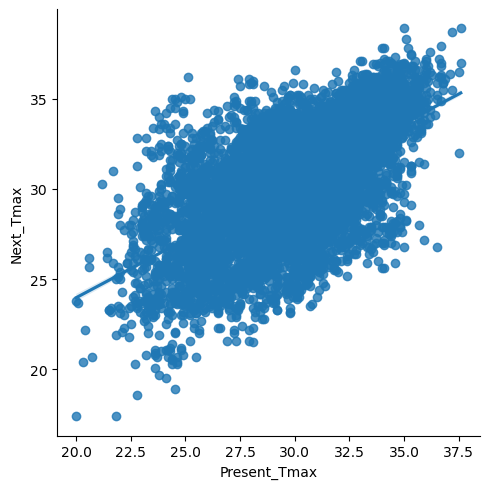

In [15]:
sns.lmplot(x ='Present_Tmax', y = 'Next_Tmax', data = df, palette = 'colorblind')

We can see a correlation between 'Present_Tmax' and 'Next_Tmax'. And the temperatures folow the best fitline. 

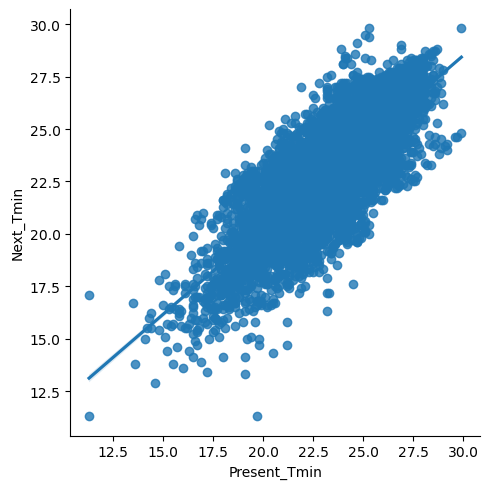

In [16]:
sns.lmplot(x ='Present_Tmin', y = 'Next_Tmin', data = df, palette = 'colorblind')

The same for min temp, also in this case the min temp follow better the bestfitline. 

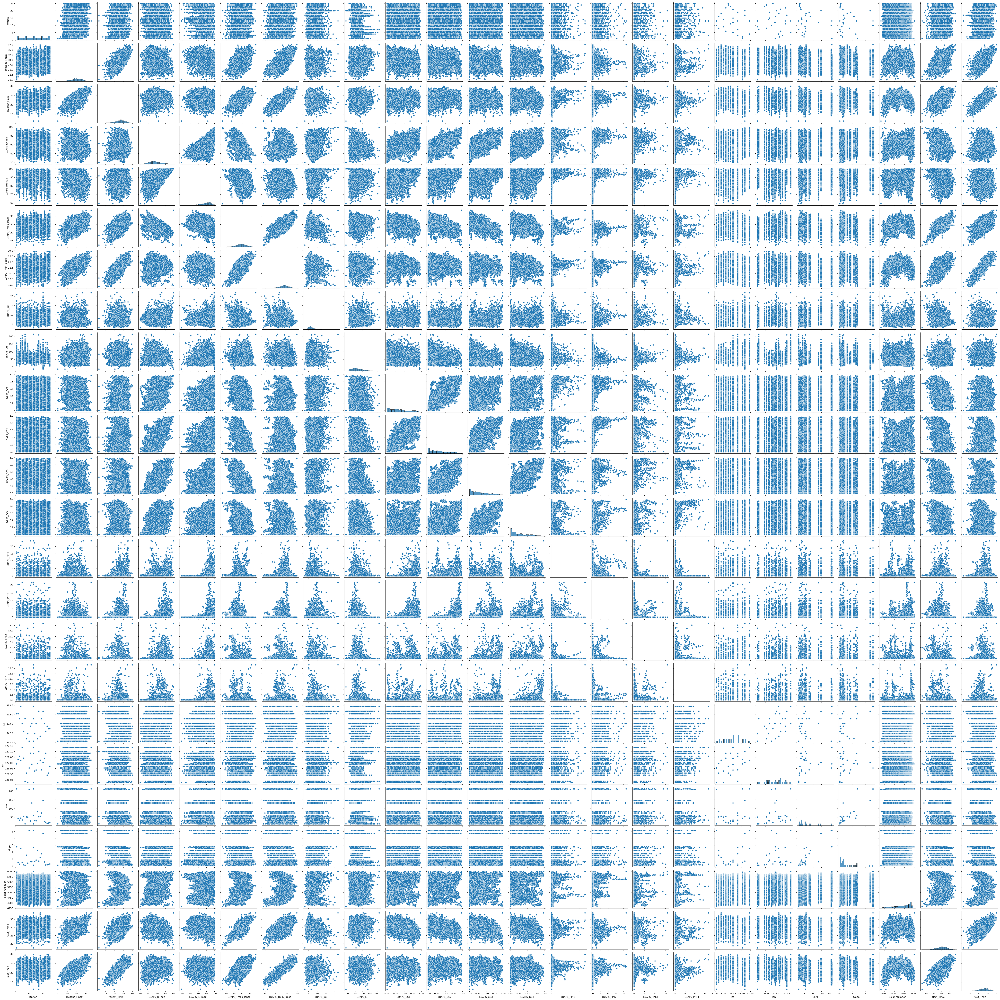

In [24]:
sns.pairplot(data = df, palette = 'Dark4')

The pairplot gives the pairwise relation between the features. On the diagonal we can notice the distribution plots.

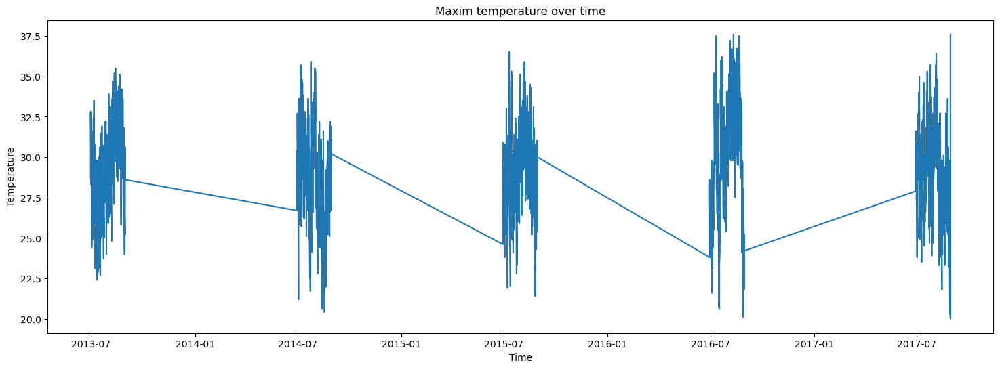

In [17]:
plt.figure(figsize = (18, 6))
plt.plot(df.Present_Tmax, label = 'maxim temperature')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.title('Maxim temperature over time')
plt.show()

In [18]:
figure = px.line(df, x="Date", 
                 y="Present_Tmax", 
                 title='Present Maxim temperature over time')
figure.show()

ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of ['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'] but received: Date

In [ ]:
figure = px.line(df, x="Date", 
                 y="Present_Tmin", 
                 title='Present Minim temperature over time')
figure.show()

In [ ]:
# setting Date as DataFrame index 
df.set_index('Date', inplace= True)

# The set_index() function is used to set DataFrame index using existing columns. 

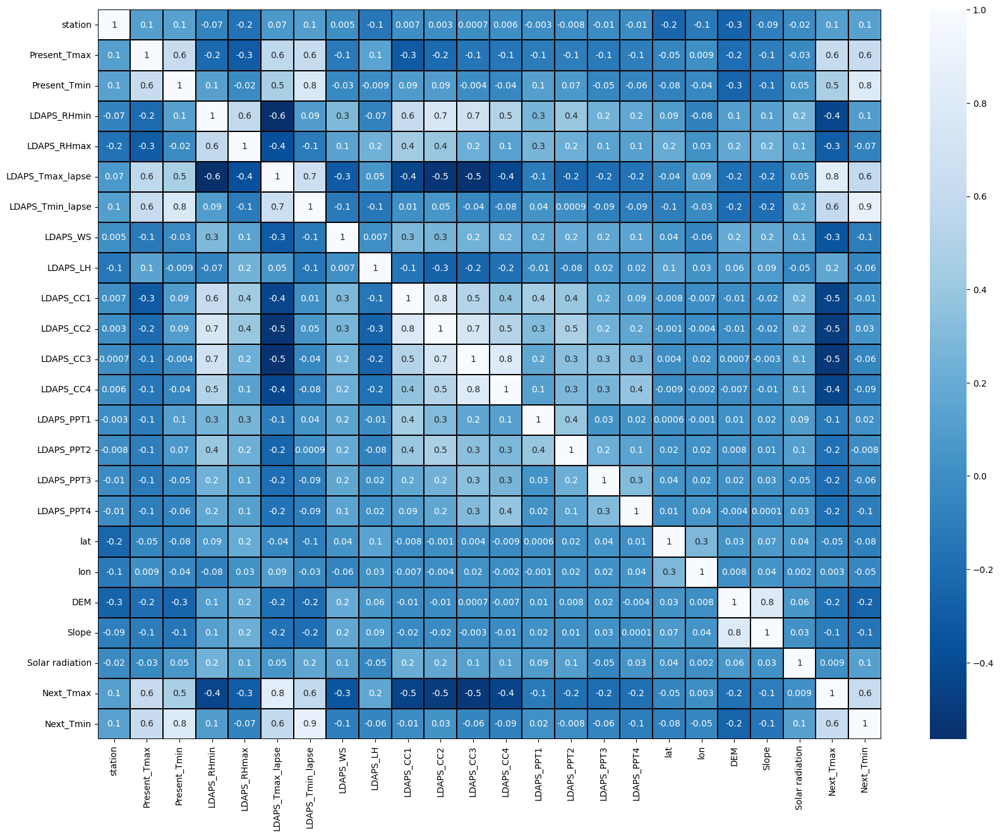

In [19]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(), linewidths = 0.1, fmt = '.1g', linecolor = 'black', annot = True, cmap = 'Blues_r')
plt.yticks(rotation = 0);
plt.show()

In [20]:
df.drop('Next_Tmin', axis = 1, inplace = True)

In [21]:
x = df.drop('Next_Tmax', axis = 1)
y = df['Next_Tmax']
print(x.shape)
print(y.shape)

(7752, 22)
(7752,)


In [22]:
from sklearn.preprocessing import StandardScaler # we can also use min max scaler 
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.664315,-0.361423,-0.759435,0.102488,0.383044,-0.524844,-0.216611,-0.128392,0.206968,-0.517365,-0.594207,-0.628281,-0.664846,-0.305790,-0.276572,-0.240818,-0.224698,1.189286,-0.005000,2.772243,1.115004,1.517935
1,-1.525622,0.720987,-0.676201,-0.308054,0.311552,0.080940,0.223900,-0.647003,-0.314839,-0.549676,-0.407796,-0.637324,-0.677493,-0.305790,-0.276572,-0.240818,-0.224698,1.189286,0.511177,-0.315157,-0.542158,1.229950
2,-1.386929,0.619511,0.031282,-0.552841,-0.615016,0.162981,0.451262,-0.441613,-1.249281,-0.611565,-0.385610,-0.458117,-0.620606,-0.305790,-0.276572,-0.240818,-0.224698,0.653021,0.838510,-0.526218,-0.723133,1.216534
3,-1.248236,0.754812,0.072899,0.101399,1.133020,0.031136,-0.079822,-0.666256,0.095998,-0.584656,-0.508131,-0.630447,-0.651727,-0.305790,-0.276572,-0.240818,-0.224698,1.991696,0.385280,-0.297588,0.932424,1.201176
4,-1.109544,0.551860,-0.551351,-0.040125,0.248731,-0.170280,-0.011135,-0.627163,1.354410,-0.833387,-0.414712,-0.559261,-0.510389,-0.305790,-0.276572,-0.240818,-0.224698,0.118743,1.807917,-0.494322,-0.548433,1.207205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,1.386929,-2.187988,-2.548952,-2.056617,-1.328160,-1.112021,-2.029627,-0.436692,0.284623,-1.298086,-1.072582,-1.277306,-1.182149,-0.305790,-0.276572,-0.240818,-0.224698,-0.149390,-1.263971,-0.852681,-0.803915,-2.093040
7748,1.525622,-2.187988,-2.299252,-2.241646,-1.548218,-0.887617,-2.047691,-0.255430,-0.454747,-1.275728,-1.096227,-1.277306,-1.182149,-0.305790,-0.276572,-0.240818,-0.224698,-0.417522,-1.037356,-0.821213,-0.755095,-2.104553
7749,1.664315,-2.221814,-2.424102,-2.317531,-1.555376,-0.570735,-2.137910,0.088062,-1.591396,-1.225650,-1.154997,-1.277306,-1.179004,-0.305790,-0.276572,-0.240818,-0.224698,-0.417522,-0.269384,-0.779043,-0.719338,-2.074325
7750,0.000000,-3.304223,-4.962720,-2.532544,-4.113477,-4.087812,-3.959093,-1.939767,-2.267498,-1.413078,-1.388103,-1.277306,-1.182149,-0.305790,-0.276572,-0.240818,-0.224698,-1.758184,-2.082302,-0.911963,-0.845455,-2.358212


In [23]:
#importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression

In [24]:
# finding the best Random State 
maxAccu = 0
maxRS = 0
for i in range(0,200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.30, random_state = i)
    lr=LinearRegression()
    lr.fit(x_train, y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
print('Maximul r2 score is ', maxAccu, ' on Random_state', maxRS)

Maximul r2 score is  0.7841894424349647  on Random_state 120


In [25]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.30, random_state = maxRS)

In [26]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso, Ridge

In [27]:
LR = LinearRegression()
LR.fit(x_train, y_train)
pred_LR = LR.predict(x_test)
pred_train = LR.predict(x_train)
print('R2_score:', r2_score(y_test, pred_LR))
print('R2_score on training Data:', r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:-', mean_absolute_error(y_test, pred_LR))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_LR))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_LR)))

R2_score: 0.7841894424349647
R2_score on training Data: 76.01617198874435
Mean Absolute Error:- 1.1137519262702715
Mean Squared Error:- 2.176545876405689
Root Mean Squared Error:- 1.475312128468308


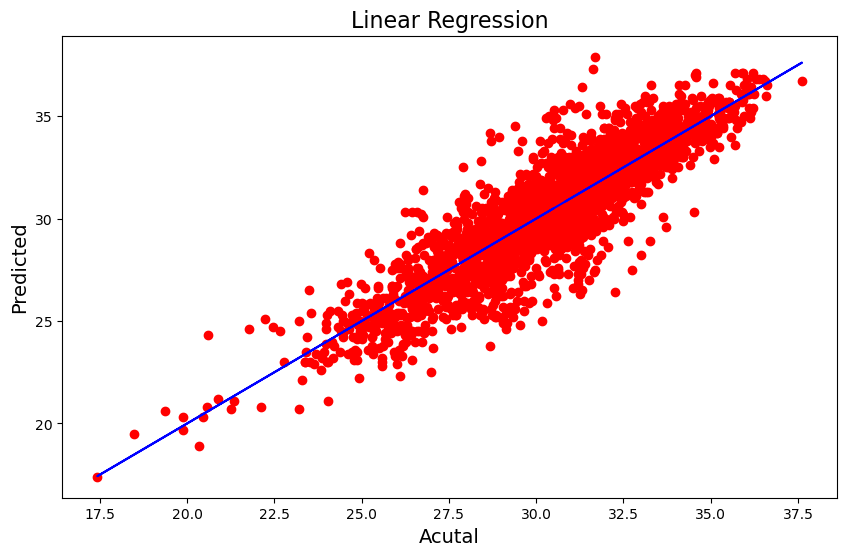

In [28]:
plt.figure(figsize = (10,6))
plt.scatter(x=pred_LR, y = y_test, color = 'r')
plt.plot(pred_LR, pred_LR, color = 'b')
plt.xlabel('Acutal', fontsize = 14)
plt.ylabel('Predicted', fontsize = 14)
plt.title('Linear Regression', fontsize = 16)
plt.show()

In [29]:
RFR = RandomForestRegressor()
RFR.fit(x_train, y_train)
pred_RFR = RFR.predict(x_test)
pred_train = RFR.predict(x_train)
print('R2_score:', r2_score(y_test, pred_RFR))
print('R2_score on training Data:', r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:-', mean_absolute_error(y_test, pred_RFR))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_RFR))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_RFR)))


R2_score: 0.9016497447162893
R2_score on training Data: 98.51866682867384
Mean Absolute Error:- 0.7380971625107484
Mean Squared Error:- 0.9919062579535688
Root Mean Squared Error:- 0.9959449070875199


In [30]:
knn = KNN()
knn.fit(x_train, y_train)
pred_knn = knn.predict(x_test)
pred_train = knn.predict(x_train)
print('R2_score:', r2_score(y_test, pred_knn))
print('R2_score on training Data:', r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:-', mean_absolute_error(y_test, pred_knn))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_knn))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_knn)))


R2_score: 0.8445391442262989
R2_score on training Data: 88.33170558071349
Mean Absolute Error:- 0.9377042132416167
Mean Squared Error:- 1.5678921754084265
Root Mean Squared Error:- 1.2521550125317658


In [31]:
GBR = GradientBoostingRegressor()
GBR.fit(x_train, y_train)
pred_GBR = GBR.predict(x_test)
pred_train = GBR.predict(x_train)
print('R2_score:', r2_score(y_test, pred_GBR))
print('R2_score on training Data:', r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:-', mean_absolute_error(y_test, pred_GBR))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_GBR))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_GBR)))


R2_score: 0.8528886262473012
R2_score on training Data: 86.20984049244656
Mean Absolute Error:- 0.9373903534984397
Mean Squared Error:- 1.4836839194825813
Root Mean Squared Error:- 1.2180656466227842


In [32]:
lasso = Lasso()
lasso.fit(x_train, y_train)
pred_lasso = lasso.predict(x_test)
pred_train = lasso.predict(x_train)
print('R2_score:', r2_score(y_test, pred_lasso))
print('R2_score on training Data:', r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:-', mean_absolute_error(y_test, pred_lasso))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_lasso))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_lasso)))


R2_score: 0.5843915440539911
R2_score on training Data: 57.04137400585088
Mean Absolute Error:- 1.639739097663486
Mean Squared Error:- 4.191596932026923
Root Mean Squared Error:- 2.0473389880591153


In [33]:
rd = Ridge()
rd.fit(x_train, y_train)
pred_rd = rd.predict(x_test)
pred_train = rd.predict(x_train)
print('R2_score:', r2_score(y_test, pred_rd))
print('R2_score on training Data:', r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:-', mean_absolute_error(y_test, pred_rd))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_rd))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_rd)))


R2_score: 0.7841856549382139
R2_score on training Data: 76.01616216185812
Mean Absolute Error:- 1.1137490848417633
Mean Squared Error:- 2.17658407500231
Root Mean Squared Error:- 1.475325074348806


In [34]:
from sklearn.tree import DecisionTreeRegressor

dtr = DecisionTreeRegressor()
dtr.fit(x_train, y_train)
pred_dtr = dtr.predict(x_test)
pred_train = dtr.predict(x_train)
print('R2_score:', r2_score(y_test, pred_dtr))
print('R2_score on training Data:', r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:-', mean_absolute_error(y_test, pred_dtr))
print('Mean Squared Error:-', mean_squared_error(y_test, pred_dtr))
print('Root Mean Squared Error:-', np.sqrt(mean_squared_error(y_test, pred_dtr)))


R2_score: 0.7753771954054051
R2_score on training Data: 100.0
Mean Absolute Error:- 1.07725709372313
Mean Squared Error:- 2.265421324161651
Root Mean Squared Error:- 1.5051316633974754


In [35]:
from sklearn.model_selection import GridSearchCV

param = {'n_estimators':[50, 100, 120], 
         'criterion':['squared_error', 'friedman_mse'],
        'max_features':['sqrt','log2'],
        'bootstrap':[False,True],
        'random_state':[10, 11, 100, 120]}

gscv = GridSearchCV(RandomForestRegressor(),param, cv=5)
gscv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'bootstrap': [False, True],
                         'criterion': ['squared_error', 'friedman_mse'],
                         'max_features': ['sqrt', 'log2'],
                         'n_estimators': [50, 100, 120],
                         'random_state': [10, 11, 100, 120]})

In [36]:
gscv.best_params_

{'bootstrap': False,
 'criterion': 'squared_error',
 'max_features': 'sqrt',
 'n_estimators': 120,
 'random_state': 100}

In [37]:
Model = RandomForestRegressor(n_estimators = 120, criterion = 'squared_error', max_features = 'sqrt', random_state= 100, bootstrap = False)

In [38]:
Model.fit(x_train, y_train)
pred=Model.predict(x_test)
print('R2_score:', r2_score(y_test,pred))
print('Mean Absolute Error:', mean_absolute_error(y_test, pred))
print('Mean Squared Error:', mean_squared_error(y_test, pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, pred)))

R2_score: 0.9212703677653332
Mean Absolute Error: 0.6567637575236458
Mean Squared Error: 0.7940235099001627
Root Mean Squared Error: 0.8910799682969889


In [40]:
import joblib
joblib.dump(Model, 'Temperature_Forecast_Tmax.pkl')

['Temperature_Forecast_Tmax.pkl']

In [41]:
# lets load the saved model and get the predictions
model = joblib.load('Temperature_Forecast_Tmax.pkl')

# prediction
prediction = model.predict(x_test)
prediction

array([31.09583333, 25.67666667, 31.33333333, ..., 31.05333333,
       32.665     , 29.75333333])

In [42]:
a = np.array(y_test) # this is to convert y_test intro array
df = pd.DataFrame({'Predicted':prediction,'Orignial':a})
df

,Predicted,Orignial
0,31.095833,31.5
1,25.676667,25.4
2,31.333333,31.3
3,33.510000,34.1
4,28.708333,28.0
...,...,...
2321,27.567500,28.0
2322,31.685000,31.8
2323,31.053333,31.6
2324,32.665000,31.8


In [43]:
conclusion = pd.DataFrame([model.predict(x_test)[:]], index = ['Predicted','Original'])
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021